<a href="https://colab.research.google.com/github/xaviermatroski/Dog-breed-identification/blob/main/dog_breed_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting the workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print(tf.__version__)
print(hub.__version__)
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

2.15.0
0.15.0
GPU available


# Getting our data ready

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
labels_csv = pd.read_csv("/content/drive/MyDrive/ML_projects/dog_breed_detection/labels.csv")
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

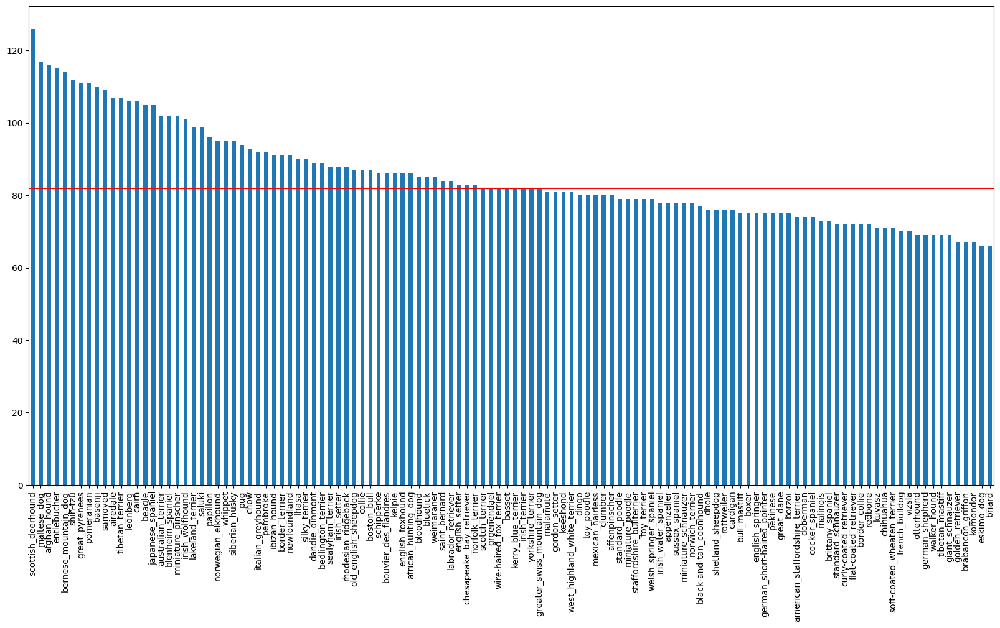

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))
plt.axhline(y=labels_csv["breed"].value_counts().median(), color="r", linestyle="-")

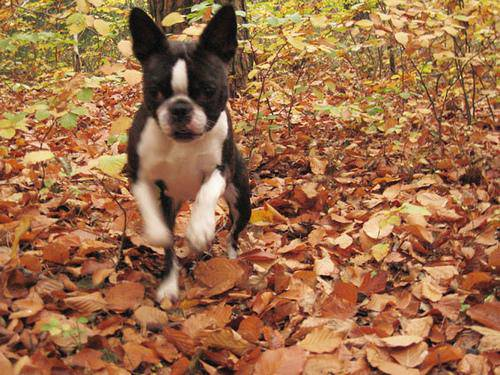

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## Getting images and their labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Creating file paths dictionary and lists according to the breeds of the dogs
dog_dict = {}
for i in range(len(labels_csv['breed'])):
  dog_dict[labels_csv['breed'][i]] = "/content/drive/MyDrive/ML_projects/dog_breed_detection/train/" + labels_csv['id'][0] + '.jpg'
print(dog_dict)

filenames = ["/content/drive/MyDrive/ML_projects/dog_breed_detection/train/" + fname + '.jpg' for fname in labels_csv['id']]

{'boston_bull': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'dingo': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'pekinese': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'bluetick': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'golden_retriever': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'bedlington_terrier': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'borzoi': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'basenji': '/content/drive/MyDrive/ML_projects/dog_breed_detection/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'scottish_deerhound': '/content/drive/MyDrive/ML_projects/dog_breed_detection/tr

In [ ]:
# Checking whether the number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/ML_projects/dog_breed_detection/train/")) == len(filenames):
  print("filenames match")
else:
  print("filenames do not match")

filenames match


## Let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
print(len(labels))

10222


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
print(len(unique_breeds))

120


In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
print(boolean_labels[:3])

[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False]), array([False, False, False, False, False, False, False, Fal

In [ ]:
# Turning boolean array into number
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))  # This is converting true and false into 1 and 0

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
NUM_IMAGES = 1000  #@param {type:"slider", min:1000, max:10222}

In [ ]:
# Splitting our data into training and validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing images(Turning images into tensors)

In [ ]:
# Convert image into NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image
# although we have succesfully converted our image into numbers or as we can say
# array of rgb color combination where each element represents a pixel
# therefore we are required to convert this into tensors such that it can be easily processed by our CPU

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches
search with names like yann lecun or jeremy howard

In [ ]:
# Create a functio to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and return a tuple of (image, label)
  """
  image = process_image(image_path, img_size=IMG_SIZE)
  return (image, label)

In [ ]:
# Demo of the above
(process_image(X[42], y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

## Now turning the whole data into batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates Batches of data out of image(X) and label(y) pairs
  Shuffles the data if it's training data but doesn't shuffle if it's a validation data.
  Also accepts test data as input
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepath
                                              tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepath
                                              tf.constant(y)))  # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling afterwards
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing image in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup up the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])  # argmax() return the place where the value is 1
    # Turn the gridlines off for a better graph
    plt.axis("off")

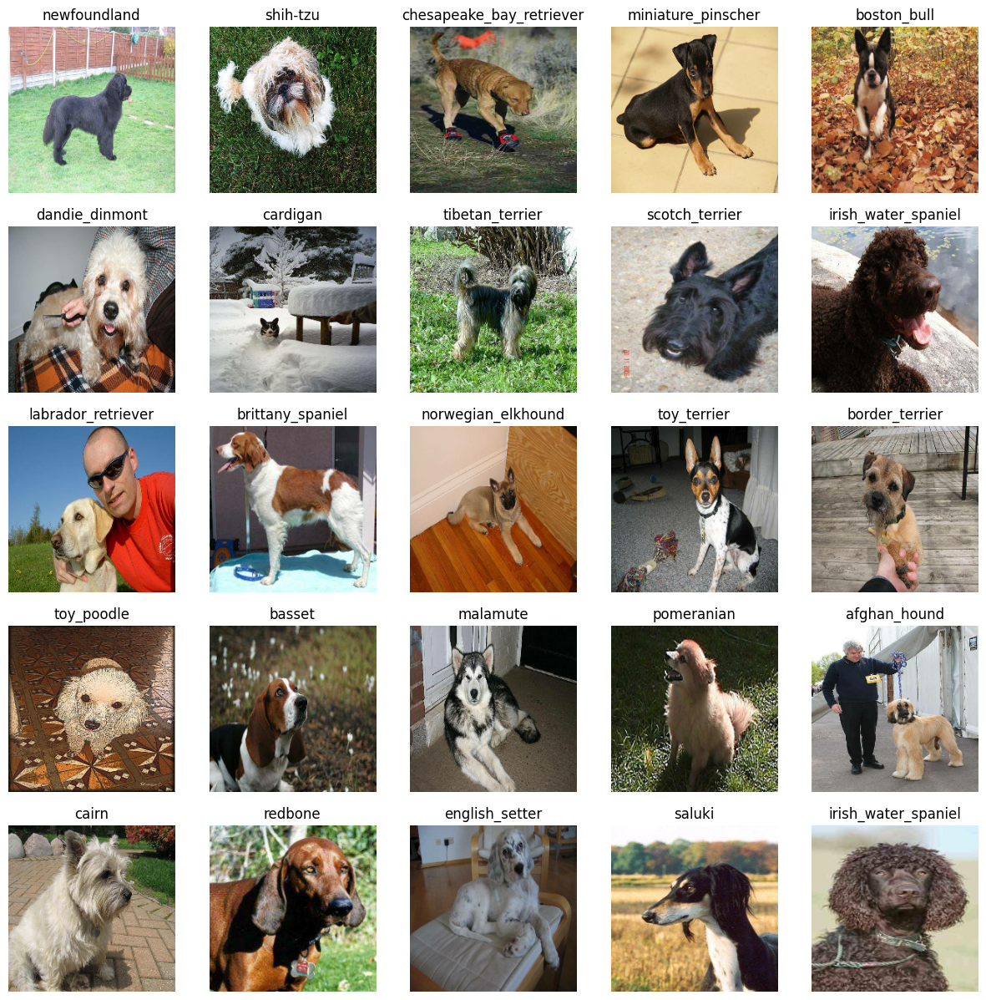

In [ ]:
# Now visualizing data in the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

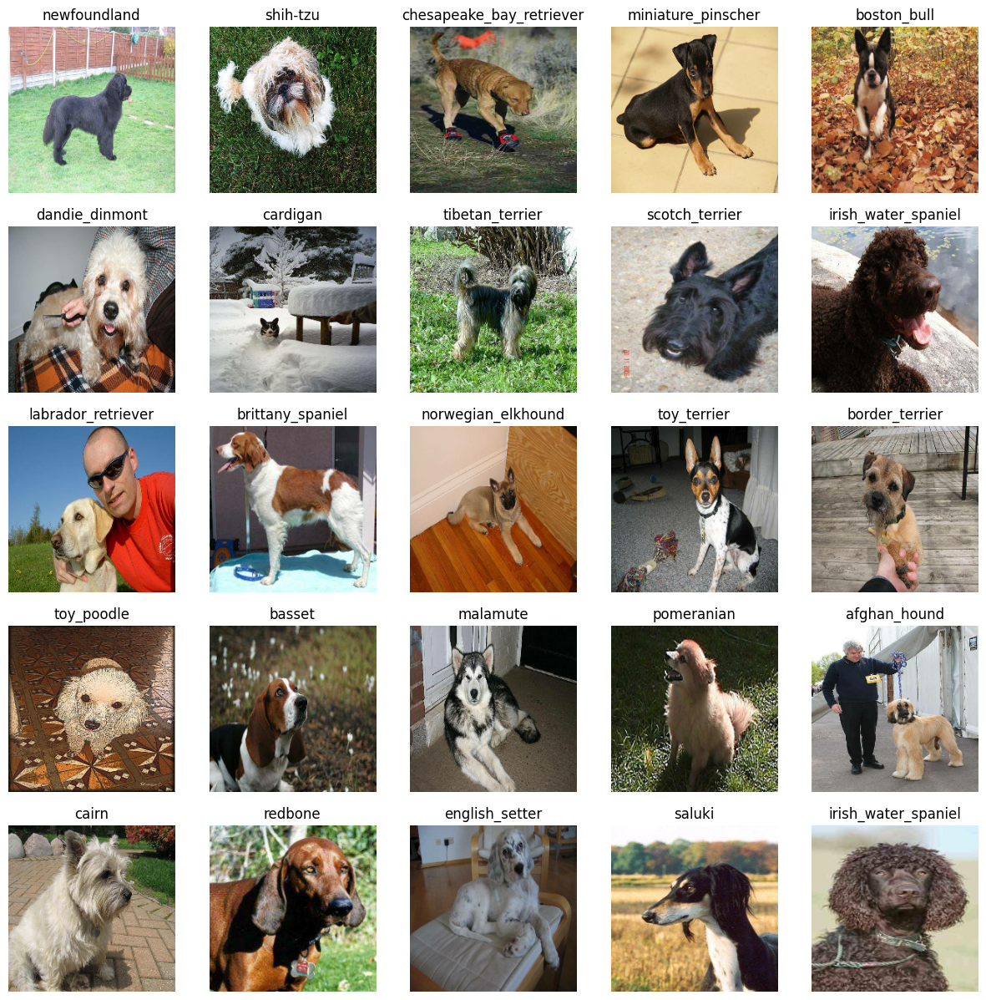

In [ ]:
# Now visualizing data in the training data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# Choosing our machine learning model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, color channels

# Setup output shape to our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup Model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"



## Creating our model

In [ ]:
# Create a function which build a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

### Tensorboard

In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("/content/drive/MyDrive/ML_projects/dog_breed_detection/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [ ]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model

In [ ]:
NUM_EPOCHS = 100  # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 315s 12s/step - loss: 4.6651 - accuracy: 0.0800 - val_loss: 3.4864 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 158ms/step - loss: 1.6851 - accuracy: 0.6812 - val_loss: 2.2225 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 4s 166ms/step - loss: 0.5866 - accuracy: 0.9275 - val_loss: 1.7294 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2591 - accuracy: 0.9787 - val_loss: 1.5087 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 166ms/step - loss: 0.1521 - accuracy: 0.9975 - val_loss: 1.4232 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1024 - accuracy: 1.0000 - val_loss: 1.3893 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================

## Checking the tensorboard logs

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/ML_projects/dog_breed_detection/logs

<IPython.core.display.Javascript object>

## Predictions

### First prediction

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 113ms/step


array([[1.9295065e-03, 5.8052727e-05, 3.6474742e-04, ..., 4.7328984e-04,
        2.4262463e-05, 3.8431413e-03],
       [1.2243698e-02, 6.0525880e-04, 1.0781141e-03, ..., 3.6181399e-04,
        1.3344131e-03, 1.4029446e-04],
       [3.1504540e-05, 9.2095179e-05, 7.8876321e-05, ..., 7.0662284e-04,
        1.8319044e-05, 3.2768040e-03],
       ...,
       [1.2267769e-06, 3.1036659e-05, 6.6050015e-05, ..., 5.3993990e-06,
        2.3931041e-05, 2.7158365e-05],
       [7.3171426e-03, 2.7445657e-04, 6.5271008e-05, ..., 4.9079124e-05,
        1.4803902e-04, 1.9378747e-03],
       [3.6234033e-04, 8.3926643e-05, 2.6325157e-04, ..., 6.5413082e-04,
        1.3856814e-04, 1.9483785e-05]], dtype=float32)

In [ ]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")  # argmax return the index where the value is max
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.92950654e-03 5.80527267e-05 3.64747422e-04 3.37517195e-05
 4.23635676e-04 7.96290406e-05 3.71126793e-02 1.90793094e-03
 6.90181274e-04 2.13270565e-03 4.47323429e-04 1.45534941e-04
 1.71208591e-03 9.72712223e-05 4.72647516e-04 5.55778912e-04
 2.79035885e-05 6.96746036e-02 2.14359643e-05 2.87234579e-04
 9.92662273e-04 9.39655874e-04 3.70871167e-05 3.64788831e-03
 2.05421034e-04 1.47539613e-04 2.07653984e-01 2.01387913e-04
 7.11580506e-04 1.37743060e-04 3.80364334e-04 3.81110352e-03
 1.54558185e-03 7.94877633e-05 3.80877405e-04 4.57580462e-02
 4.80786639e-06 2.34513631e-04 8.65733236e-05 2.84261387e-05
 6.35744422e-04 2.37031345e-05 3.47389810e-04 3.51687086e-05
 1.37654235e-04 1.04158622e-04 2.61138375e-05 8.49262142e-05
 4.83242882e-04 7.86047895e-05 3.20480060e-04 2.72958841e-05
 1.96119095e-03 6.17287151e-05 4.17826377e-04 1.01783247e-04
 2.39216999e-04 4.58581932e-03 3.80007201e-04 2.14712590e-01
 2.96094455e-04 3.86088832e-05 1.02533039e-03 1.31098050e-05
 4.72301675e-04 2.497161

### Visualizing our predictions

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Gets a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'irish_wolfhound'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels
  """
  images = []
  labels = []
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatichify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the predictions is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)


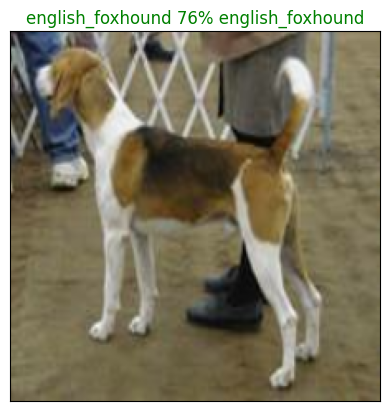

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=90)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 predictions labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

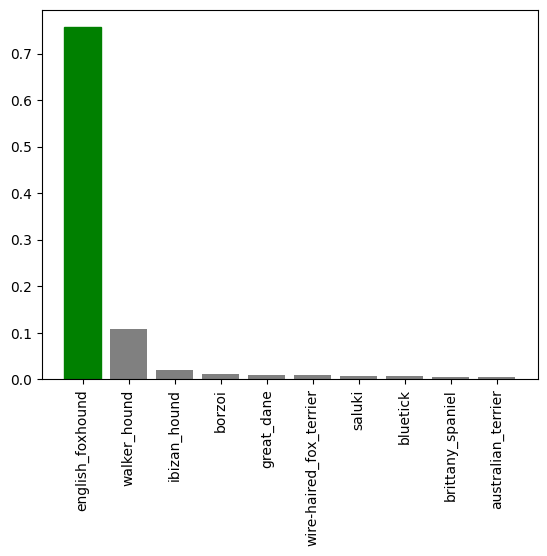

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=90)

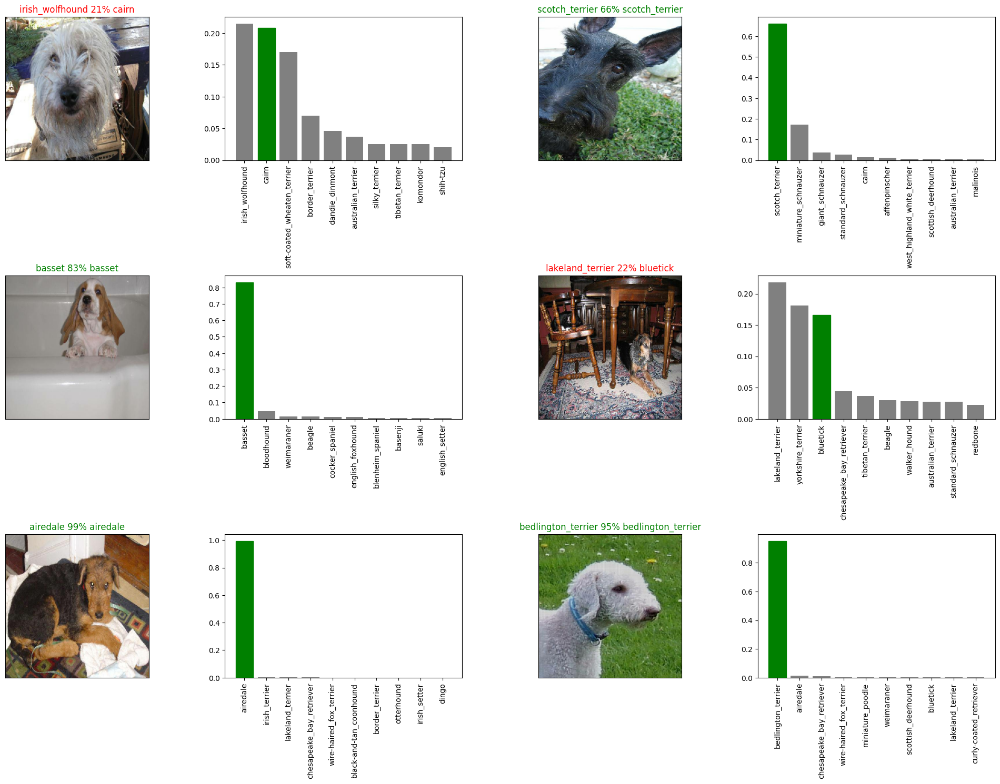

In [ ]:
# Let's check few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving our Model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/ML_projects/dog_breed_detection/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-21281705440482-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-21281705440482-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-21281705440482-1000-images-mobilenetv2-Adam.h5")

Loading a saved model from: /content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-21281705440482-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate a pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 204ms/step - loss: 1.2847 - accuracy: 0.6400


[1.2847158908843994, 0.6399999856948853]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 146ms/step - loss: 1.2847 - accuracy: 0.6400


[1.2847158908843994, 0.6399999856948853]

# Training the model on the full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation dataset when training on all the data, so we can't monitor validation memory
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# fit the model to the full data set
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 47s 135ms/step - loss: 1.3298 - accuracy: 0.6666
Epoch 2/100
320/320 [==============================] - 43s 133ms/step - loss: 0.4063 - accuracy: 0.8780
Epoch 3/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2368 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1549 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1064 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0767 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0588 - accuracy: 0.9907
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0452 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0377 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 42s 130m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-22071705442825-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-22071705442825-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Loading in the model trained on 10,000+ images aka full-model
loaded_full_model = load_model("/content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-22071705442825-full-image-set-mobilenetv2-Adam.h5")

Loading a saved model from: /content/drive/MyDrive/ML_projects/dog_breed_detection/models/20240116-22071705442825-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/ML_projects/dog_breed_detection/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e09f4ff3f7acee994812650a2fc7edef.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e3d417026b89cbb57b00a7208421009d.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e37be38e73463da5a0d9f3e33263d287.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/e70c62f51defaa5295fe3e52099c4ce3.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 '/content/drive/MyDrive/ML_projects/dog_breed_detection/test/de93f567cf5830e982182435db086

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making predictions on the test data batch
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 378s 1s/step
